# TP4, INF8225 2025, Projet


## Imports

In [ ]:
from IPython.display import clear_output

%pip install torch torchvision --index-url https://download.pytorch.org/whl/cu121
%pip install numpy
%pip install swig
%pip install box2d
%pip install pygame
%pip install gymnasium
%pip install "gymnasium[box2d]"
%pip install matplotlib
%pip install wandb

clear_output()

In [1]:
import numpy as np
import gymnasium as gym
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation
import torch
import torch.nn as nn
from torch.distributions import MultivariateNormal, Categorical
import torchvision.transforms as T
import time
import os
import wandb
from IPython.display import clear_output

### Initialisation

In [2]:
print(torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(torch.version.cuda)

if torch.cuda.is_available():
	print(torch.cuda.get_device_name(0))

True
12.1
NVIDIA GeForce GTX 1050


## Data Declaration

In [3]:
def show_animation(env):
	show_animation_frames(env.render())

def show_animation_frames(frames):
	fig = plt.figure(figsize=(7, 5))
	plt.axis('off')
	im = plt.imshow(frames[0])

	def animate(i):
		im.set_data(frames[i * 2])
		return im,

	anim = animation.FuncAnimation(fig, animate, frames=int(len(frames) / 2), repeat=False)
	plt.close(fig)
	display(HTML(anim.to_jshtml()))

def show_current_frame(env, data):
	frame = env.render()
	fig, _ = plt.subplots()
	r = fig.canvas.get_renderer()
	plt.imshow(frame)
	plt.axis('off')
	texts = []
	size_used = 0
	for key in data:
		title = f'{key}: {data[key]}'
		if type(data[key]) == float or type(data[key]) == torch.Tensor:
			title = f'{key}: {data[key]:.2f}'
		text = plt.text(0, 0, title, fontsize=12, color='black', backgroundcolor='white', ha="center")
		size_used += text.get_window_extent(renderer=r).width
		texts.append(text)
	split = (700 - size_used) / (len(data) + 1)
	next_position = split
	for t in texts:
		t.set_position((next_position, 0))
		next_position = next_position + t.get_window_extent(renderer=r).width + split
	clear_output(wait=True)
	plt.show()

def skip_zooming(env):
	no_action = 0
	if type(env.action_space) != gym.spaces.Discrete:
		no_action = np.zeros((env.action_space.shape[0]))

	for i in range(50):
		observation, _, terminated, truncated, info = env.step(no_action)

		if terminated or truncated:
			observation, info = env.reset()
			break
	return observation, info

## Implementation

### PPO

#### Model

In [4]:
transform = T.Compose([
	T.ToPILImage(),
	T.Grayscale(num_output_channels=1),
	T.Resize((84, 84)),
	T.ToTensor(),
	T.Normalize((0.5,), (0.5,))
])

class Actor(nn.Module):
	def __init__(self, is_discrete, action_dim, actor_std, hidden_sizes=[1024, 512], is_log_std = False):
		super().__init__()

		self.is_discrete = is_discrete
		self.is_log_std = is_log_std
		self.actor_std = actor_std
		self.action_dim = action_dim
			
		self.cnn = nn.Sequential(
			nn.Conv2d(1, 32, 8, stride=4), nn.LeakyReLU(),
			nn.Conv2d(32, 64, 4, stride=2), nn.LeakyReLU(),
			nn.Conv2d(64, 64, 3, stride=1), nn.LeakyReLU(),
			nn.Flatten()
		)

		with torch.no_grad():
			dummy = torch.zeros(1, 1, 84, 84)
			n_flatten = self.cnn(dummy).shape[1]

		layers = []
		in_features = n_flatten
		for hidden in hidden_sizes:
			layers.append(nn.Linear(in_features, hidden))
			layers.append(nn.LeakyReLU())
			in_features = hidden
		
		layers.append(nn.Linear(in_features, action_dim))
		if not self.is_discrete:
			layers.append(nn.Tanh())
		
		self.fc = nn.Sequential(*layers)

		if not self.is_discrete:
			if is_log_std:
				self.std = nn.Parameter(torch.full((action_dim,), torch.log(torch.tensor(self.actor_std))).to(device))
			else:
				self.std = torch.full((action_dim,), self.actor_std).to(device)
		
	def forward(self, x):
		x = self.cnn(x)
		mean = self.fc(x)

		if self.is_discrete:
			return mean

		current_std = self.std

		if self.is_log_std:
			current_std = self.std.exp()
			
		return mean, current_std
	

class Critic(nn.Module):
	def __init__(self, hidden_sizes=[1024, 512]):
		super().__init__()

		self.cnn = nn.Sequential(
			nn.Conv2d(1, 32, 8, stride=4), nn.LeakyReLU(),
			nn.Conv2d(32, 64, 4, stride=2), nn.LeakyReLU(),
			nn.Conv2d(64, 64, 3, stride=1), nn.LeakyReLU(),
			nn.Flatten()
		)

		with torch.no_grad():
			dummy = torch.zeros(1, 1, 84, 84)
			n_flatten = self.cnn(dummy).shape[1]

		layers = []
		in_features = n_flatten
		for hidden in hidden_sizes:
			layers.append(nn.Linear(in_features, hidden))
			layers.append(nn.LeakyReLU())
			in_features = hidden

		layers.append(nn.Linear(in_features, 1))
		self.fc = nn.Sequential(*layers)

	def forward(self, x):
		x = self.cnn(x)
		return self.fc(x)

class PPO:
	def __init__(self, env, save_path="ppo.pth", lr_actor=3e-4, lr_critic=3e-4, actor_std=0.4, gamma=0.99, eps_clip=0.2, K_epochs=4, is_log_std = False, actor_embeddings=[1024, 512], critic_embeddings=[1024, 512]):
		self.env = env
		self.is_discrete = type(self.env.action_space) == gym.spaces.Discrete
		
		if not self.is_discrete:
			self.action_space_low = torch.tensor(self.env.action_space.low).to(device)
			self.action_space_high = torch.tensor(self.env.action_space.high).to(device)
			self.action_dim = env.action_space.shape[0]
		else:
			self.action_dim = env.action_space.n
		
		self.save_path = save_path
		self.actor = Actor(self.is_discrete, self.action_dim, actor_std, actor_embeddings, is_log_std).to(device)
		self.critic = Critic(critic_embeddings).to(device)
		self.optimizer = torch.optim.Adam([
						{'params': self.actor.parameters(), 'lr': lr_actor},
						{'params': self.critic.parameters(), 'lr': lr_critic}
					])
		self.gamma = gamma
		self.eps_clip = eps_clip
		self.K_epochs = K_epochs
		
		self.mse_loss = nn.MSELoss()
	
	def save(self):
		try:
			torch.save({ 'actor_state_dict': self.actor.state_dict(), 'critic_state_dict': self.critic.state_dict() }, self.save_path)
		except:
			return

	def load(self):
		if os.path.isfile(self.save_path):
			checkpoint = torch.load(self.save_path, map_location=device)
			self.actor.load_state_dict(checkpoint['actor_state_dict'])
			self.critic.load_state_dict(checkpoint['critic_state_dict'])

	def select_action(self, state):
		with torch.no_grad():
			state = transform(state).unsqueeze(0).to(device)

			if self.is_discrete:
				logits = self.actor(state)
				dist = Categorical(logits=logits)
				action = dist.sample()
				return action.item(), dist.log_prob(action).item()
			
			mean, std = self.actor(state)
			action_cov = torch.diag_embed(std**2)
			dist = MultivariateNormal(mean, action_cov)
			action = dist.sample()
			log_prob = dist.log_prob(action).sum(-1)
			formated_action = torch.tensor((action[0] + 1) / 2 * (self.action_space_high - self.action_space_low) + self.action_space_low).to(device)
			formated_action = torch.clamp(formated_action, self.action_space_low, self.action_space_high)
		
			return formated_action.cpu().numpy(), log_prob.item()

	def evaluate(self, states, actions):
		if self.is_discrete:
			logits = self.actor(states)
			dist = Categorical(logits=logits)
			log_probs = dist.log_prob(actions)
			entropy = dist.entropy()
		else:
			mean, std = self.actor(states)
			action_cov = torch.diag_embed(std**2)
			dist = MultivariateNormal(mean, action_cov)
			log_probs = dist.log_prob(actions).sum(-1)
			entropy = dist.entropy().sum(-1)

		values = self.critic(states).squeeze(-1)
			
		return log_probs, values, entropy

	def compute_returns(self, rewards, dones, next_value):
		returns = []
		R = next_value
		for step in reversed(range(len(rewards))):
			R = rewards[step] + self.gamma * R * (1 - dones[step])
			returns.insert(0, R)

		returns = np.array(returns, dtype=np.float32)
		returns = torch.flatten(torch.from_numpy(returns).float()).to(device)
	
		return returns

	def update(self, memory):
		states = torch.stack(memory['states']).to(device)

		if self.is_discrete:
			actions = torch.tensor(memory['actions']).to(device)
		else:
			actions = torch.stack(memory['actions']).to(device)

		old_log_probs = torch.tensor(memory['log_probs']).to(device)
		returns = memory['returns']

		for _ in range(self.K_epochs):
			log_probs, values, entropy = self.evaluate(states, actions)
			advantages = returns - values.detach()

			advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)

			ratio = (log_probs - old_log_probs).exp()
			surr1 = ratio * advantages
			surr2 = torch.clamp(ratio, 1 - self.eps_clip, 1 + self.eps_clip) * advantages
			actor_loss = -torch.min(surr1, surr2).mean()
			critic_loss = self.mse_loss(values, returns)
			loss = actor_loss + 0.5 * critic_loss - 0.01 * entropy.mean()
			print(f"Loss: {loss}")

			self.optimizer.zero_grad()
			loss.backward()
			self.optimizer.step()

		self.save()
		return loss

In [5]:
config = {
	"seed": 42,
	"max_episodes": 300000,
	"max_timesteps": 10000,
	"max_losing_step": 75,
	"is_log_std": True,
	"load_save": False,
	"lr_actor": 3e-4,
	"actor_std": 0.2,
	"actor_embeddings": [1024, 512],
	"lr_critic": 3e-4,
	"critic_embeddings": [1024, 512],
	"gamma": 0.99,
	"eps_clip": 0.2,
	"k_epochs": 10, 
	"continuous": False,
	"lap_complete_percent": 0.95,
	"stop_criteria_count": 10
}

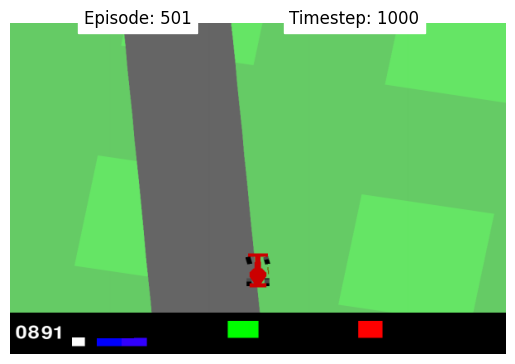

Loss: 192.35284423828125
Loss: 185.48472595214844
Loss: 170.2069854736328
Loss: 155.39828491210938
Loss: 148.6704864501953
Loss: 151.5894012451172
Loss: 158.3134002685547
Loss: 160.37042236328125
Loss: 154.32666015625
Loss: 144.09669494628906
Episode 501 - Reward: 892.5 - Time: 31.876349210739136


current_reward,▁▂▂▇▄▁▂▆▂▆█▂▂▄▃▂▂▁▁▁▁▂▂▂▁▁▂▁▁▁▂▂▂▂▂▁▁█▄▇
done,▁▁▁▁▁▁▁██▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
episode,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇███
loss,▁▁▁▁▃▄▄▄▃▃█▄▂▁▁▁▁▁▁▁▁▁▁▂▁▁▂▂▁▁▁▁▄▁▁▁▁▁▂▃
reward,▂▇▁▂▄▁▇█▇█▂▁▁▂▂▂▂▁▂▂▁▁▂▂▂▂▂▂▂▂▂▄▁▁▅▇██▆█
timestep,▂██▂▃▄▄▃▆▇▂▁▇▆▄▃▂▁▂▃▂▂▄▇▃▂▂▂▁█▂▂▂▄█▇▇▇█▅
current_reward,892.53286
done,1
episode,501
loss,144.09669
reward,892.53286


In [ ]:
with wandb.init(
		config=config,
		project='INF8225 - TP4',
		group='PPO',
		save_code=True,
		mode="online"
	):
	max_episodes = config["max_episodes"]
	env = gym.make("CarRacing-v3", render_mode="rgb_array", domain_randomize=False, max_episode_steps=config["max_timesteps"], continuous=config["continuous"], lap_complete_percent=config["lap_complete_percent"])
	ppo = PPO(env, lr_actor=config["lr_actor"], lr_critic=config["lr_critic"], actor_std=config["actor_std"], gamma=config["gamma"], eps_clip=config["eps_clip"], K_epochs=config["k_epochs"], is_log_std=config["is_log_std"], actor_embeddings=config["actor_embeddings"], critic_embeddings=config["critic_embeddings"])

	if config["load_save"]:
		ppo.load()
		
	successful_run = 0

	ppo.actor.train()
	ppo.critic.train()
	for ep in range(max_episodes):
		start = time.time()
		state, _ = env.reset(seed=config["seed"])
		state, _ = skip_zooming(env)
		
		memory = {'states': [], 'actions': [], 'log_probs': [], 'rewards': [], 'dones': []}
		total_reward = 0
		t = 0

		while True:
			state_t = transform(state).to(device)
			memory['states'].append(state_t)

			action, log_prob = ppo.select_action(state)
			next_state, reward, done, trunc, _ = env.step(action)

			if type(env.action_space) == gym.spaces.Discrete:
				memory['actions'].append(action)
			else:
				memory['actions'].append(torch.FloatTensor(action).to(device))
			memory['log_probs'].append(log_prob)
			memory['rewards'].append(reward)
			memory['dones'].append(done)

			state = next_state
			total_reward += reward
			wandb.log({"current_reward": total_reward, "timestep": t})

			if t % 50 == 0:
				show_current_frame(env, {"Episode": ep, "Timestep": t})

			if done or trunc or (len(memory['rewards']) > config["max_losing_step"] and np.max(np.array(memory['rewards'][-config["max_losing_step"]:])) < 0):
				break

			t += 1

		with torch.no_grad():
			next_state_t = transform(state).unsqueeze(0).to(device)
			next_value = ppo.critic(next_state_t).item()
		memory['returns'] = ppo.compute_returns(memory['rewards'], memory['dones'], next_value)

		loss = ppo.update(memory)
		image = wandb.Image(env.render(), caption=f"Episode {ep}")
		print(f"Episode {ep} - Reward: {total_reward:.1f} - Time: {time.time() - start}")

		logs = {"episode": ep, "reward": total_reward, "loss": loss, "image": image, "done": int(done) }
		if type(env.action_space) != gym.spaces.Discrete:
			next_std = ppo.actor.std
			if ppo.actor.is_log_std:
				next_std = ppo.actor.std.exp()
			logs["steering_std"] = next_std[0]
			logs["gas_std"] = next_std[1]
			logs["brake_std"] = next_std[2]
		
		wandb.log(logs)

		if memory['dones'][-1] == True:
			successful_run += 1

			if successful_run >= config["stop_criteria_count"]:
				break

	env.close()

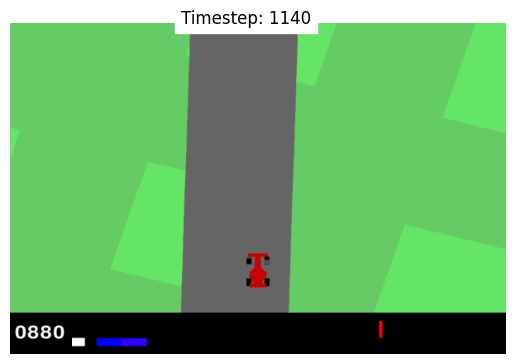

Test reward: 878.83


In [26]:
env = gym.make("CarRacing-v3", render_mode="rgb_array", domain_randomize=False, max_episode_steps=config["max_timesteps"], continuous=config["continuous"], lap_complete_percent=config["lap_complete_percent"])
state, _ = env.reset(seed=config["seed"])
state, _ = skip_zooming(env)

ppo = PPO(env, lr_actor=config["lr_actor"], lr_critic=config["lr_critic"], actor_std=config["actor_std"], gamma=config["gamma"], eps_clip=config["eps_clip"], K_epochs=config["k_epochs"], is_log_std=config["is_log_std"], actor_embeddings=config["actor_embeddings"], critic_embeddings=config["critic_embeddings"])
ppo.load()

total_reward = 0
frames = []

ppo.actor.eval()
ppo.critic.eval()
for t in range(config["max_timesteps"]):
	with torch.no_grad():
		action, _ = ppo.select_action(state)

	state, reward, done, trunc, _ = env.step(action)
	total_reward += reward

	frames.append(env.render())
	show_current_frame(env, {"Timestep": t})

	if done or trunc:
		break

env.close()
print(f"Test reward: {total_reward:.2f}")
show_animation_frames(frames)